In [2]:
import numpy

In [3]:
data_245_spectrum = numpy.load("/home/ahess/Documents/245_spectrum_AJ.npz")

In [4]:
print(data_245_spectrum.files)

['arr_0', 'arr_1']


In [5]:
frequency = data_245_spectrum['arr_0']
amplitude = data_245_spectrum['arr_1']

In [6]:
print(frequency)

[2.4037200e+08 2.4037204e+08 2.4037208e+08 ... 2.4662188e+08 2.4662192e+08
 2.4662196e+08]


In [7]:
print(len(frequency))

156250


In [8]:
print(amplitude)

[0.47280578 0.4769591  0.46712134 ... 0.39893454 0.40035376 0.40685285]


# Plot von allen Peaks zusammen und Logarithmisierung

In [9]:
import matplotlib.pyplot as plt

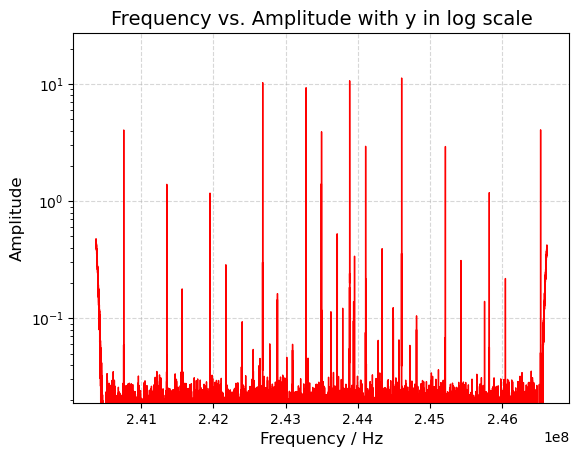

In [10]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.yscale("log")
plt.ylim(1.9e-2,None)
plt.title("Frequency vs. Amplitude with y in log scale", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 

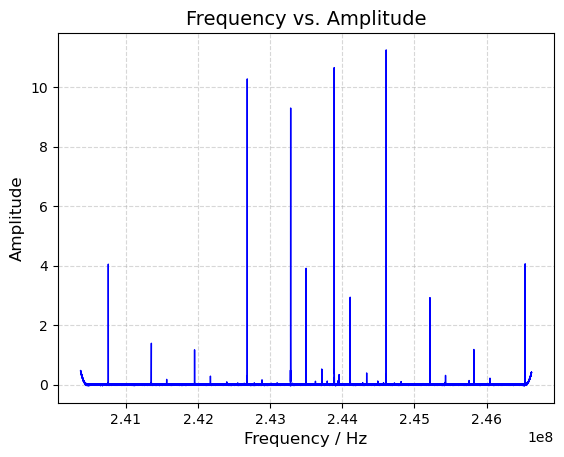

In [11]:
plt.figure()
plt.plot(
    frequency,amplitude, color="blue", linewidth=1)
#plt.ylim(0,4)
plt.title("Frequency vs. Amplitude", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 



# Plot von einzelnen Peaks

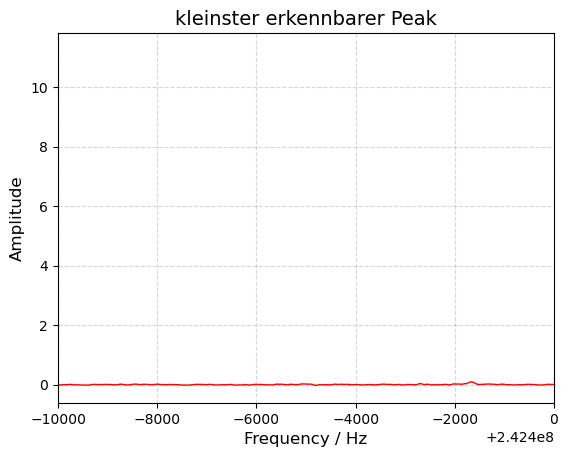

In [12]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.xlim(2.4239*1e8,2.424*1e8)
plt.title("kleinster erkennbarer Peak", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5)    

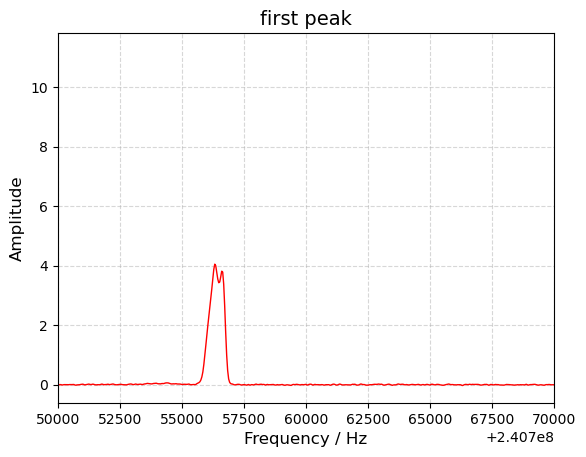

In [13]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.xlim(2.4075*1e8,2.4077*1e8)
plt.title("first peak", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 


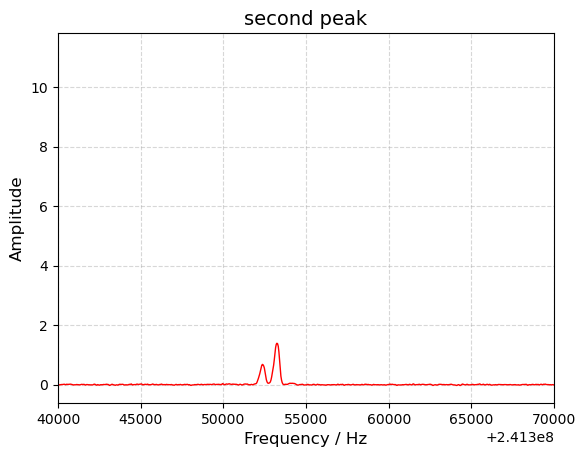

In [14]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.xlim(2.4134*1e8,2.4137*1e8)
plt.title("second peak", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 


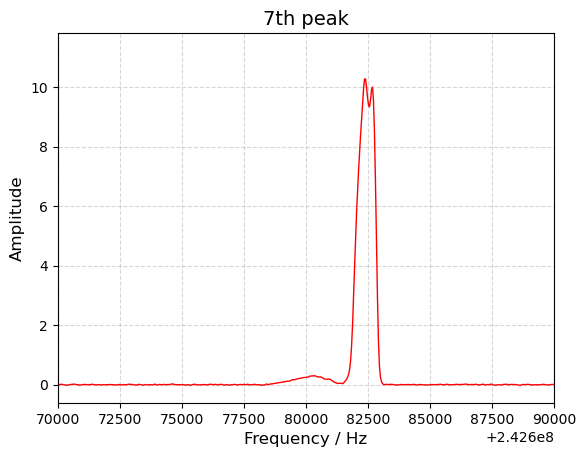

In [15]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.xlim(2.4267*1e8,2.4269*1e8)
plt.title("7th peak", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 


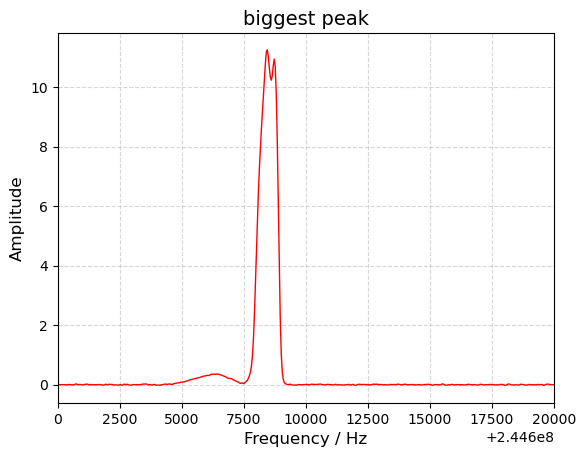

In [16]:
plt.figure()
plt.plot(
    frequency,amplitude, color="red", linewidth=1)
plt.xlim(2.446*1e8,2.4462*1e8)
plt.title("biggest peak", fontsize=14)
plt.xlabel("Frequency / Hz", fontsize=12)
plt.ylabel("Amplitude", fontsize=12)

plt.grid(True, linestyle="--", alpha=0.5) 


# Interaktive Plots

In [17]:
import sys
print(sys.executable)

/usr/bin/python


In [18]:
#Does not look great at all, still just lines and nothing like gauss peaks
import pyqtgraph

ymin = 0.0
ymax = 1
app = pyqtgraph.mkQApp()
win = pyqtgraph.plot(frequency, amplitude)
win.setLogMode(x=False,y=True)
win.setYRange(ymin, ymax)

pyqtgraph.exec()

0

In [19]:
#toll aber ich sehe lieber alle peaks auf einmal ohne schwer hin und her schieben zu müssen
import plotly.graph_objects
fig = plotly.graph_objects.Figure()
fig.add_trace(plotly.graph_objects.Scatter(x=frequency,
    y=amplitude,
    mode="lines",
    name="Spektrum"
))
fig.update_layout(
    title="Interaktives Spektrum",
    xaxis_title="frequency",
    yaxis_title="amplitude"
)


fig.show()


# Automatisiertes plotten von einzelnen Peaks

In [20]:
from scipy.signal import find_peaks

In [131]:
import numpy as np

def find_peaks_derivative(
    frequency,
    amplitude,
    threshold=0.005,# minimale Höhe
    f_min=2.4053e8,
    f_max=2.4654e8,   
    min_distance_hz=None # optional Abstand
):
    # 🔹 1. Frequenzbereich beschneiden
    if f_min is not None or f_max is not None:
        mask = np.ones_like(frequency, dtype=bool)

        if f_min is not None:
            mask &= frequency >= f_min
        if f_max is not None:
            mask &= frequency <= f_max

        frequency = frequency[mask]
        amplitude = amplitude[mask]

    # 🔹 2. Ableitung berechnen
    derivative = np.gradient(amplitude, frequency)

    # 🔹 3. Peaks über Vorzeichenwechsel (+ → -)
    zero_crossings = np.where(
        (np.sign(derivative[:-1]) > 0) &
        (np.sign(derivative[1:]) < 0)
    )[0]

    # 🔹 4. Höhenfilter
    peaks = []
    for idx in zero_crossings:
        if amplitude[idx] > threshold:
            peaks.append(idx)

    peaks = np.array(peaks)

    # 🔹 5. Mindestabstand (optional)
    if min_distance_hz is not None and len(peaks) > 1:
        filtered = [peaks[0]]
        for p in peaks[1:]:
            if abs(frequency[p] - frequency[filtered[-1]]) > min_distance_hz:
                filtered.append(p)
        peaks = np.array(filtered)

    return peaks

In [132]:
import matplotlib.pyplot as plt

In [133]:
peaks = find_peaks_derivative(
    frequency,
    amplitude,
    threshold=0.04,
    f_min=2.4053e8,
    f_max=2.4654e8,  
    min_distance_hz=1
)

In [134]:
def plot_spectrum_with_peaks(frequency, amplitude, peaks, f_min=None, f_max=None):
    
    # 🔹 1. Maske für Frequenzbereich
    mask = np.ones_like(frequency, dtype=bool)

    if f_min is not None:
        mask &= frequency >= f_min
    if f_max is not None:
        mask &= frequency <= f_max

    # 🔹 2. Gefilterte Daten
    freq_cut = frequency[mask]
    amp_cut = amplitude[mask]

    # 🔹 3. Peaks anpassen (nur gültige behalten)
    peaks_cut = peaks[mask[peaks]]

    # 🔹 4. Plot
    plt.figure()

    plt.plot(freq_cut, amp_cut, color="blue", linewidth=1)

    plt.scatter(freq_cut[peaks_cut], amp_cut[peaks_cut], color="red")

    plt.title("Spectrum with detected peaks")
    plt.xlabel("Frequency / Hz")
    plt.ylabel("Amplitude")

    plt.show()

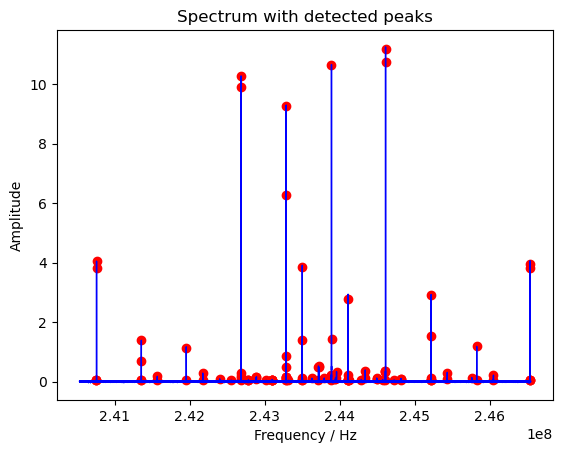

In [135]:
plot_spectrum_with_peaks(
    frequency,
    amplitude,
    peaks,
    f_min=2.4053e8,
    f_max=2.4654e8,
)

In [144]:
import numpy as np
import plotly.graph_objects as go

def plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=None,
    f_max=None,
    merge_window=5 # Anzahl Datenpunkte
):

    # 1. Frequenzbereich schneiden
    mask = np.ones_like(frequency, dtype=bool)

    if f_min is not None:
        mask &= frequency >= f_min
    if f_max is not None:
        mask &= frequency <= f_max

    freq_cut = frequency[mask]
    amp_cut = amplitude[mask]

    peaks = peaks[mask[peaks]]

    # 2. MERGE: doppelte Peaks in kleinem Bereich entfernen
    filtered_peaks = []
    used = np.zeros(len(peaks), dtype=bool)

    for i, p in enumerate(peaks):
        if used[i]:
            continue

        # Fenster um aktuellen Peak
        window_mask = np.abs(peaks - p) <= merge_window

        group = peaks[window_mask]
        used[window_mask] = True

        # nimm den höchsten Peak im Cluster
        best_peak = group[np.argmax(amp_cut[group])]
        filtered_peaks.append(best_peak)

    filtered_peaks = np.array(filtered_peaks)

    # 3. Plot
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=freq_cut,
        y=amp_cut,
        mode="lines",
        name="Spektrum"
    ))

    fig.add_trace(go.Scatter(
        x=freq_cut[filtered_peaks],
        y=amp_cut[filtered_peaks],
        mode="markers",
        marker=dict(color="red", size=8),
        name="Peaks"
    ))

    for p in filtered_peaks:
        fig.add_vline(
            x=freq_cut[p],
            line_dash="dash",
            line_color="red"
        )

    fig.update_layout(
        title="Spektrum mit gefilterten Peaks",
        xaxis_title="Frequency",
        yaxis_title="Amplitude"
    )

    fig.show()

In [ ]:
plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=2.4053e8,
    f_max=2.4654e8,
)

In [228]:
import numpy as np
from scipy.signal import find_peaks

def find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.2,
    prominence_mid=0.02,
    distance_mid=10,
    threshold_edge=0.01,
    merge_edge_points=7   # jetzt konsistent: Punkte statt Hz
):

    fmin, fmax = frequency.min(), frequency.max()
    span = fmax - fmin

    edge_low = fmin + edge_fraction * span
    edge_high = fmax - edge_fraction * span

    # 1. Mitte → find_peaks
    mid_mask = (frequency > edge_low) & (frequency < edge_high)

    peaks_mid, _ = find_peaks(
        amplitude[mid_mask],
        prominence=prominence_mid,
        distance=distance_mid
    )

    # Index zurück in Originalarray
    peaks_mid = np.where(mid_mask)[0][peaks_mid]

    # 2. Rand → einfache Peak-Erkennung
    edge_mask = ~mid_mask
    edge_indices = np.where(edge_mask)[0]

    peaks_edge = []

    for i in edge_indices:
        if i == 0 or i == len(amplitude) - 1:
            continue

        if amplitude[i-1] < amplitude[i] > amplitude[i+1]:
            if amplitude[i] > threshold_edge:
                peaks_edge.append(i)

    peaks_edge = np.array(peaks_edge)

    # 3. Merge im Rand (in Datenpunkten)
    def merge_peaks_fast(peaks, amplitude, merge_points=5):

        if len(peaks) == 0:
            return peaks

        peaks = np.sort(peaks)
        merged = []

        current_group = [peaks[0]]

        for p in peaks[1:]:
            if p - current_group[-1] <= merge_points:
                current_group.append(p)
            else:
                # beste Auswahl
                group = np.array(current_group)
                best = group[np.argmax(amplitude[group])]
                merged.append(best)

                current_group = [p]

        # letzte Gruppe
        group = np.array(current_group)
        best = group[np.argmax(amplitude[group])]
        merged.append(best)

        return np.array(merged)

    peaks_edge = merge_peaks_fast(
        peaks_edge,
        amplitude,
        merge_points=merge_edge_points
    )

    # 4. Kombinieren
    peaks_all = np.unique(np.concatenate([peaks_mid, peaks_edge]))

    return peaks_all

In [229]:
peaks = find_peaks_adaptive(
    frequency,
    amplitude,
    edge_fraction=0.2,
    prominence_mid=0.065,
    distance_mid=7,
    threshold_edge=0.04,
    merge_edge_points=6
)

In [230]:
import plotly.graph_objects as go

def plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=None,
    f_max=None
):

    fig = go.Figure()

    # Spektrum
    fig.add_trace(go.Scatter(
        x=frequency,
        y=amplitude,
        mode="lines",
        name="Spektrum"
    ))

    # Peaks direkt (kein Mapping nötig!)
    fig.add_trace(go.Scatter(
        x=frequency[peaks],
        y=amplitude[peaks],
        mode="markers",
        marker=dict(color="red", size=6),
        name="Peaks"
    ))

    # X-Achse begrenzen (statt schneiden!)
    if f_min is not None and f_max is not None:
        fig.update_xaxes(range=[f_min, f_max])

    fig.update_layout(
        title="Spektrum mit Peaks",
        xaxis_title="Frequency",
        yaxis_title="Amplitude"
    )

    fig.show()

In [231]:
plot_spectrum_with_peaks_plotly(
    frequency,
    amplitude,
    peaks,
    f_min=2.4053e8,
    f_max=2.4655e8
)

# Mathematische Beschreibung der Peaks

# Interaktiver Plot mit sich im Abstand von 2Mhz wiederholenden Peaks (markiert)

In [39]:
import numpy as np
from scipy.signal import find_peaks

def compute_peak_area(frequency, amplitude, center, window):
    mask = (frequency >= center - window) & (frequency <= center + window)
    f = frequency[mask]
    a = amplitude[mask]

    if len(f) < 2:
        return 0

    return np.trapezoid(a, f)


def find_peaks_stepwise(
    frequency,
    amplitude,
    step=2e6,
    window=1e6,
    threshold=0.0,
    f_min_cut=None,
    f_max_cut=None,
    alpha=1e-6,         # Gewicht für Abstand
    area_tol=(0.3, 3)   # erlaubtes Verhältnis zur Referenzfläche
):

    # Frequenzbereich beschneiden
    if f_min_cut is not None and f_max_cut is not None:
        mask = (frequency >= f_min_cut) & (frequency <= f_max_cut)
        frequency = frequency[mask]
        amplitude = amplitude[mask]

    # Start: globales Maximum
    start_idx = np.argmax(amplitude)
    start_f = frequency[start_idx]
    start_a = amplitude[start_idx]

    peaks_found = [(start_f, start_a)]

    # Referenzfläche berechnen
    ref_area = compute_peak_area(frequency, amplitude, start_f, window)

    # in beide Richtungen gehen
    for direction in [+1, -1]:

        current = start_f

        while True:

            target = current + direction * step

            # Abbruch wenn außerhalb
            if target < frequency.min() or target > frequency.max():
                break

            # lokales Fenster
            mask = (frequency >= target - window) & (frequency <= target + window)
            local_f = frequency[mask]
            local_a = amplitude[mask]

            if len(local_a) == 0:
                break

            # Peaks im Fenster finden (mit Threshold!)
            local_peaks, _ = find_peaks(local_a, height=threshold)

            if len(local_peaks) == 0:
                break

            # Fläche für jeden Kandidaten berechnen
            areas = []
            for p in local_peaks:
                pf = local_f[p]
                area = compute_peak_area(frequency, amplitude, pf, window)
                areas.append(area)

            areas = np.array(areas)

            # Verhältnis zur Referenz
            ratio = areas / ref_area

            # gültige Peaks (ähnliche Fläche)
            valid = (ratio > area_tol[0]) & (ratio < area_tol[1])

            if not np.any(valid):
                break

            valid_peaks = local_peaks[valid]
            valid_areas = areas[valid]

            # Abstand zum Ziel
            distances = np.abs(local_f[valid_peaks] - target)

            # Score: Fläche + Abstand
            score = valid_areas - alpha * distances

            best_idx = valid_peaks[np.argmax(score)]

            peak_f = local_f[best_idx]
            peak_a = local_a[best_idx]

            peaks_found.append((peak_f, peak_a))

            current = peak_f

    return np.array(peaks_found)

In [40]:
import plotly.graph_objects as go

peaks_found_from_max = find_peaks_stepwise(
    frequency,
    amplitude,
    step=2e6,
    window=0.1e6,
    threshold=0.02,         # anpassen!
    f_min_cut=2.4048e8,          # optional
    f_max_cut=2.4654e8           # optional
)

fig = go.Figure()

fig.add_trace(go.Scatter(
    x=frequency,
    y=amplitude,
    mode="lines",
    name="Spektrum"
))

fig.add_trace(go.Scatter(
    x=peaks_found_from_max[:,0],
    y=peaks_found_from_max[:,1],
    mode="markers",
    marker=dict(color="red", size=8),
    name="Peaks"
))

for f, a in peaks_found_from_max:
    fig.add_vline(
        x=f,
        line_dash="dash",
        line_color="red"
    )

fig.update_layout(
    title="Interaktives Spektrum",
    xaxis_title="frequency",
    yaxis_title="amplitude"
)

fig.show()